## 🐶End to end Multi-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

### 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

### 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

### 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

### 4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

In [2]:
#Unzip the uploaded data into google drive
# !unzip "drive/MyDrive/Dog-vision/dog-breed-identification_2.zip" -d "drive/MyDrive/Dog-vision/"

### Get our workspace ready
* import tensorflow 2.x ✔️
* Import tensorflow hub
* Make sure we're using a GPU

In [2]:
# Import tensorflow into colab
import tensorflow as tf
print("TF version :", tf.__version__)

TF version : 2.17.0


In [3]:
#Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version :", tf.__version__)
print("TF_HUB version :", hub.__version__)

#Check for GPU availability
print("GPU","available (YESS)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version : 2.17.0
TF_HUB version : 0.16.1
GPU available (YESS)


## Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [4]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


<Axes: xlabel='breed'>

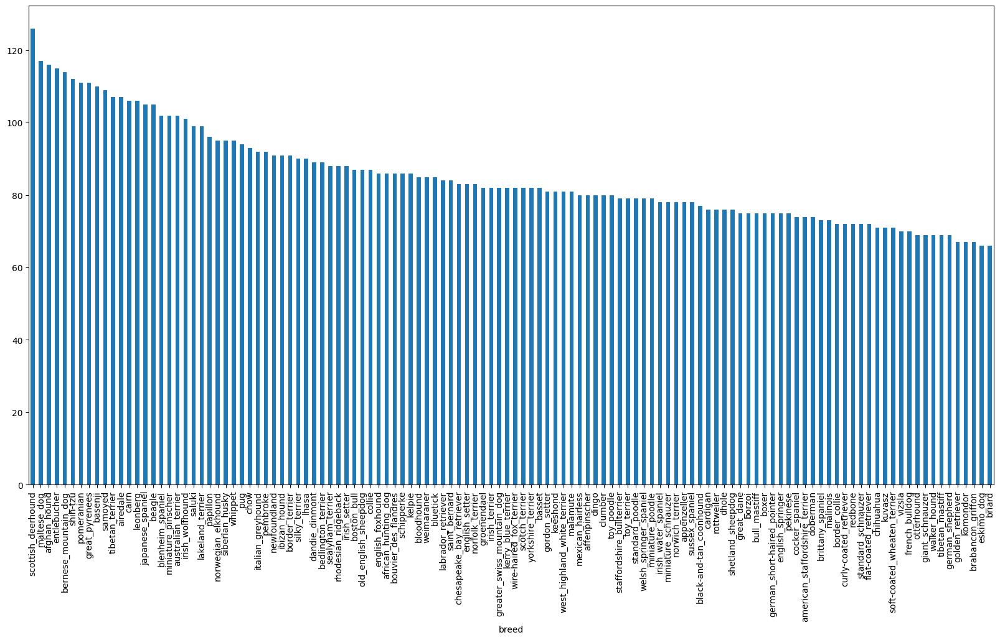

In [5]:
# How many images are there of each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
# What is the median number of images per class?
labels_csv["breed"].value_counts().median()

82.0

In [7]:
# let's view an image
from IPython.display import Image
# Image("drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels
Let's get a list of all of our image file pathnames

In [8]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [9]:
#Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog-vision/train/"+ fname+ ".jpg" for fname in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [10]:
#Check whether number of file names matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog-vision/train/")) == len(filenames):
  print("File names matched")
else:
  print("Do not matched")

File names matched


Since we've now got our training image filepaths in a list ,let's prepare our labels.

In [11]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels) #does the same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
len(labels)

10222

In [13]:
#Find the unique labels
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [14]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [15]:
# Turn a single label into array of boolean
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [16]:
len(labels)

10222

In [17]:
# Turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
len(boolean_labels)

10222

In [19]:
# Example: turning boolean array into numbers
print(labels[0]) #Original label
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Create our own validation set
Since the dataset from kaggle doesn't come with a validation set , we're going to create our own.

In [20]:
# Setup X and y variables
X = filenames
y = boolean_labels

In [21]:
len(filenames)

10222

We will start experimenting with ~1000 images and increase when needed.

In [22]:
#Set number of images used for experimenting
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10000,step:1000}

In [23]:
#Let's split our data into train and valid set
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2)
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [24]:
#Let's have a look at training data
X_train[:5],y_train[:2]

(['drive/MyDrive/Dog-vision/train/0f976e55b3634296183b2b1c051d5bda.jpg',
  'drive/MyDrive/Dog-vision/train/05a5e6f6b575688dc304ae72635db7b6.jpg',
  'drive/MyDrive/Dog-vision/train/0df07a23ab97135ce7d390f2d12e388d.jpg',
  'drive/MyDrive/Dog-vision/train/12c65c69fa9e112448f7d26ed34abb57.jpg',
  'drive/MyDrive/Dog-vision/train/055cfac66e5d67756ab05d02baeeb04c.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

#Preprocessing Images(Turning Images into Tensors)
To process our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use tensorflow to read a file and save it to a variable. `image`
3. Turn our `image` (a jpg) into Tensors.
4. Normalize our image(conver color channels values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224,224).
6. Return the modified `image`.

Before we do lets see what importing an image looks like.

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
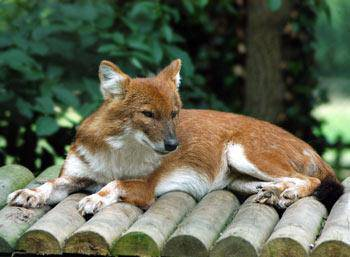

In [25]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image

In [26]:
image.max(),image.min()

(255, 0)

In [27]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [28]:
#turn image into tensor
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we've seen what an image looks like as a Tensor,let's make a function to preprocess them.

We'll create a function to:

1. Take an image filepath as input
2. Use tensorflow to read a file and save it to a variable. image
3. Turn our image (a jpg) into Tensors.
4. Normalize our image(conver color channels values from 0-255 to 0-1)
5. Resize the image to be a shape of (224,224).
6. Return the modified image.

More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [29]:
#define image size
IMG_SIZE = 224

#Create a function for preprocessing images
def process_image(image_path,img_size = IMG_SIZE):
  """
  Take an image filepath and turn the image into a tensor.
  """
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turn the jpeg image into Tensor with 3 color channels (Red,Green,Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  #Convert the colour channels values from 0-255 into 0-1 values
  image = tf.image.convert_image_dtype(image,tf.float32)
  #Resize the image to our desired value (224,224)
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image

# Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: `(image, label)`.

In [30]:
#Create a simple function to return a tuple
def get_image_label(image_path,label):
  """
  Takes an image filepath name and the associated label,
  processes the image and return a tuple (image,label)
  """
  image = process_image(image_path)
  return image,label

In [31]:
#Demo of the above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn all of our data (X & y) into batches!

In [32]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

#Create a function to turn data into batches
def create_data_batches(X,y=None,batch_size = BATCH_SIZE,valid_data = False,test_data = False):
  """
  Create batches of data out of image(X), and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is a test data we probably don't have labels.
  if test_data:
    print("Creating test data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #only filepath(no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #IF the data is valid dataset ,we dont need to shuffle it
  elif valid_data:
    print("Creating validation data batches..")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) #labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches..")
    #Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    #Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=(len(X)))

    #Create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    #turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [33]:
#Create training and validation data batches
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches..
Creating validation data batches..


In [34]:
#Check out different attribute of our data batches
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing data batches
Our data is now in batches,however,these can be a litle hard to understand/comprehend, let's visualize them.

In [35]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images,labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  #Setup the figure
  fig, axes = plt.subplots(5, 5, figsize=(10, 10))

  # Loop through 25 images and show them on the grid
  for i, ax in enumerate(axes.flat):
        # Display an image
        ax.imshow(images[i])

        # Add the image label as the title (assuming one-hot encoded labels)
        ax.set_title(unique_breeds[labels[i].argmax()])

        # Turn the grid lines off
        ax.axis("off")

    # Adjust layout to prevent overlap
  plt.tight_layout()
  plt.show()

In [36]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [37]:
# # Now let's visualize the data in a training batch
# train_images, train_labels = next(train_data.as_numpy_iterator())
# show_25_images(train_images, train_labels)

In [38]:
# # Now let's visualize our validation set
# val_images, val_labels = next(val_data.as_numpy_iterator())
# show_25_images(val_images, val_labels)

# Building a model
Before we build a model there are few things we need to define:
* The input shape (our image shape, in the form of tensors) to our model.
* The output shape (image labels,in the form of tensors) of our model.
* The URL of of the model we want to use from TensorFlow Hub -https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [39]:
IMG_SIZE

224

In [40]:
# Setup input shape to the model
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] #batch,height,width,colour channels
#Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

#Setup model URL from tensor flow
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [41]:
type(INPUT_SHAPE)

list

Now we've got our inputs,outputs and model ready to go. let's put them together into Keras deep learning model!

Knowing these,let's create a function which:
* Take the input shape,output shape and the model we've chosen as parameters.
* Define the layers in a keras model in sequential fashion(do this first,then this,then that).
* Compiles the model(says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Return the model.
All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview


In [42]:
# Create a function which builds a Keras model
import tf_keras
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf_keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf_keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [43]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress,check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our model progress and another for early stopping which prevents our model from training for too long.

### Tensor Board Callback

To setup a tensorboard callback we need to do 3 things:

1. Load the TensorBoard notebook extension ✔️
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function.
3. Visualize our model training logs with `%tensorboard` magic function (we'll do this after model training)
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [44]:
# Load TensorBoard notebbok extension
%reload_ext tensorboard

In [45]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  #Create a log directiory to store tensorboard logs
  logdir = os.path.join("drive/MyDrive/Dog-vision/logs",
                        #Make it so the logs get tracked whenever we run an experimient
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(logdir)

### Early stopping callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [46]:
#Create early stopping callback
early_stopping = tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",patience = 3)

## Train a model (on a subset of data)
Our first model is only going to train 1000 images,to make sure everything is working

In [47]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [48]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


Let's create a function that builds a model:
* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model


In [49]:
#Build a function to train and return a trained model.
def train_model():
  """
  Trains a given model and returned the trained version
  """
  #Create a model
  model = create_model()

  #Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  #Fitting the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks=[tensorboard,early_stopping])
  #return the fitted model
  return model

In [50]:
#Fit the model to data
# model = train_model()

Question: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note**: Overfitting to begin with is a good thing! It means our model is learning!!!

## Checking the tensorboard logs
The tensorboard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents

In [51]:
%tensorboard --logdir drive/MyDrive/Dog-vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model




In [54]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [55]:
#Make predictions on the validation data(not used to train on)
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 190ms/step


array([[0.00111151, 0.00034128, 0.0004509 , ..., 0.00152531, 0.00145033,
        0.00901713],
       [0.00281469, 0.0042255 , 0.00143494, ..., 0.00551148, 0.00870296,
        0.00473566],
       [0.00042546, 0.0004782 , 0.00045046, ..., 0.00210776, 0.00128557,
        0.00197077],
       ...,
       [0.0007763 , 0.01233647, 0.00055415, ..., 0.0262746 , 0.00341353,
        0.00293188],
       [0.0065126 , 0.00477262, 0.00011781, ..., 0.00104391, 0.00393838,
        0.00214264],
       [0.00021236, 0.01281882, 0.00096375, ..., 0.00088723, 0.01016992,
        0.00881403]], dtype=float32)

In [56]:
predictions[0]

array([1.11150730e-03, 3.41281353e-04, 4.50899679e-04, 3.26594408e-03,
       1.39937187e-02, 1.91891007e-02, 1.79884140e-03, 4.37600026e-03,
       3.26409732e-04, 4.74961847e-03, 6.49921887e-04, 1.43320309e-02,
       9.89576103e-04, 1.67782104e-03, 5.07253036e-03, 7.28261843e-03,
       1.73109979e-03, 6.12985902e-03, 2.10680976e-03, 1.95780694e-02,
       1.59709918e-04, 1.08679943e-03, 6.17960515e-03, 5.71891178e-05,
       1.38413324e-03, 2.81767308e-04, 6.87807240e-03, 7.89548550e-03,
       7.91151484e-04, 6.63496042e-03, 5.09959087e-03, 2.59148441e-02,
       6.30095426e-04, 9.72646638e-04, 1.35153122e-02, 1.08736439e-03,
       1.45656487e-03, 1.20985566e-03, 1.07598840e-03, 3.12572233e-02,
       3.66083323e-03, 6.11377764e-04, 1.67830603e-03, 3.67672853e-02,
       3.26268449e-02, 2.93217599e-03, 1.12056239e-02, 6.57026190e-03,
       2.33883457e-03, 2.42903712e-03, 1.28295915e-02, 8.24014470e-03,
       1.12168258e-04, 6.75383781e-04, 5.12697909e-04, 3.58365499e-03,
      

In [57]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.82799129e-03 1.70328072e-03 8.53490178e-03 6.39593303e-02
 7.13609857e-04 7.61336705e-04 7.72527710e-04 4.87273466e-03
 1.81707758e-02 2.10024156e-02 1.63704678e-02 4.32671653e-03
 1.48017053e-03 2.11399733e-04 2.24901177e-03 2.60443073e-02
 1.62804936e-04 5.35444880e-04 3.31856124e-03 8.43812246e-03
 3.18167312e-03 7.02233228e-04 1.22329721e-03 1.35802431e-03
 2.94928759e-04 1.06973527e-03 2.79111266e-02 5.21458453e-04
 1.12480912e-02 6.68865454e-04 1.48578733e-02 9.30348318e-03
 1.51057104e-02 7.90688617e-04 1.92924365e-02 4.18281322e-03
 9.87821724e-03 5.40543050e-02 4.27188497e-04 4.83298115e-03
 7.29219243e-03 4.14869143e-03 1.21400354e-03 5.04810689e-03
 1.73609087e-03 4.34955437e-04 9.11922194e-04 1.61623023e-02
 1.67707261e-02 4.73421533e-03 1.37102569e-03 7.07699452e-04
 1.43566383e-02 3.24084563e-03 6.17506215e-03 8.01553426e-04
 6.71912450e-04 1.94157232e-02 8.47683288e-04 1.31476636e-03
 9.73946881e-04 7.46540609e-04 8.81912711e-04 1.21443148e-03
 1.04989540e-02 3.512381

In [58]:
unique_breeds[15]

'bluetick'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilities are also known as confidence levels.

In [59]:
#Turn predictions prob. into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

## Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'bloodhound'

In [60]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [61]:
#Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  #Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

#Unbatchify the validation data
val_images,val_labels = unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.22111346, 0.10738796, 0.03679972],
         [0.21827732, 0.10455183, 0.03396359],
         [0.21477592, 0.10105043, 0.03046219],
         ...,
         [0.46738085, 0.4394337 , 0.37817717],
         [0.4681682 , 0.44071722, 0.3679547 ],
         [0.47404423, 0.44956937, 0.3661312 ]],
 
        [[0.22198881, 0.10826332, 0.04551821],
         [0.21377084, 0.10004534, 0.03730023],
         [0.20635475, 0.09262925, 0.02988414],
         ...,
         [0.21263187, 0.16860282, 0.11483873],
         [0.27499896, 0.23694304, 0.17784962],
         [0.3008227 , 0.26357448, 0.19841018]],
 
        [[0.2177171 , 0.10399161, 0.04187675],
         [0.21190476, 0.09817928, 0.03606443],
         [0.20640758, 0.09268208, 0.03056723],
         ...,
         [0.39781314, 0.34196576, 0.2997739 ],
         [0.26208293, 0.20623562, 0.16404374],
         [0.25980425, 0.20395692, 0.16176504]],
 
        ...,
 
        [[0.24605747, 0.21076335, 0.1911555 ],
         [0.31821248, 0.28291836, 0.26331

Now we've got ways to get:
* Prediction labels
* Validation labels(Truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [62]:
def plot_pred(prediction_probabilities,labels,images,n=1):
  """
  View the predictions, ground truth and image for sample n.
  """
  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  #get the pred label
  pred_label = get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([]);
  plt.yticks([]);

  #Change the colour of title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change the plot title to be predicted , probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

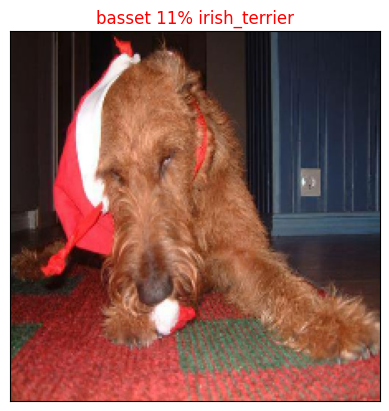

In [63]:
plot_pred(prediction_probabilities = predictions,labels = val_labels,images=val_images,n=77)

Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
     * Prediction probabilities indexes ✅
     * Prediction probabilities values ✅
     * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [64]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob,true_label = prediction_probabilities[n],labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidences indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #Find the top 10 predictions confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")

  #Change the color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

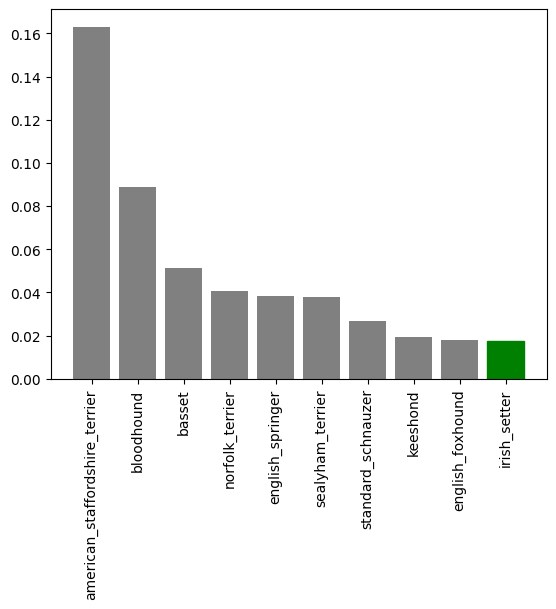

In [65]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)


Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

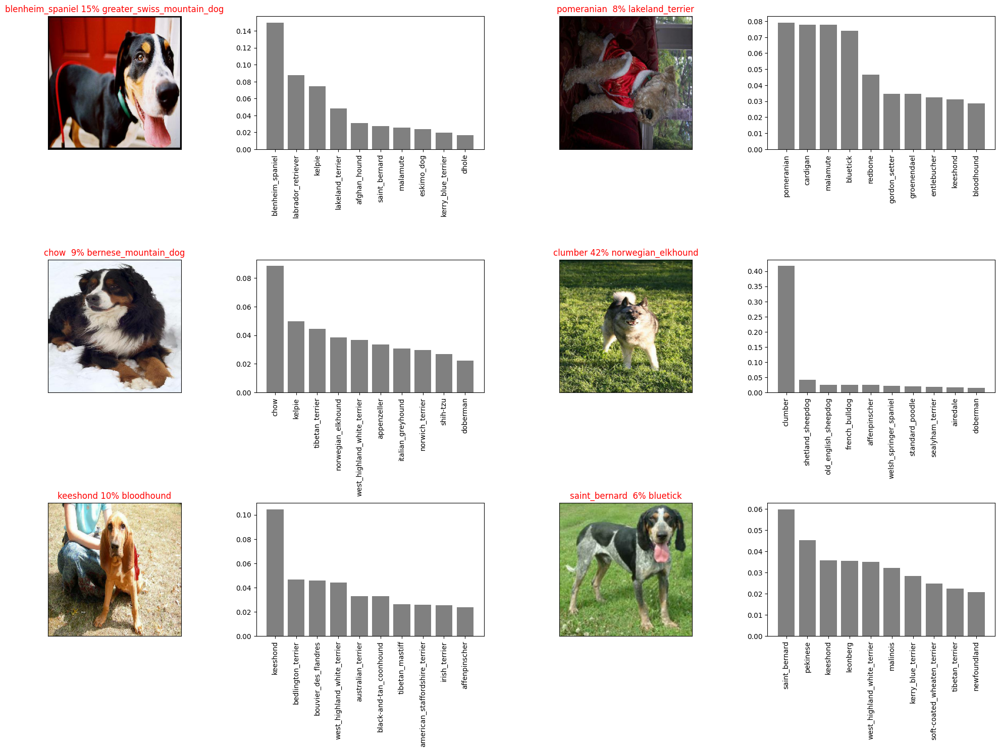

In [66]:
#Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize = (10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels= val_labels,
            images = val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [67]:
# Create a function to save a model
def save_model(model,suffix = None):
  """
  Save a given model in a models directory and appends a suffix(string).
  """
  #Create a model directory pathname with current time.
  modeldir = os.path.join("drive/MyDrive/Dog-vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" #save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [68]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Load a saved model from a specific path
  """
  print(f"Loading saved model from: {model_path}")
  model = tf_keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [69]:
#Save our model trained on 1000 images
save_model(model,suffix = "1000-images-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Dog-vision/models/20240909-20431725914587-1000-images-mobilenetV2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog-vision/models/20240909-20431725914587-1000-images-mobilenetV2-Adam.h5'

In [70]:
# Load a trained model
loaded_1000_image_model = load_model("drive/MyDrive/Dog-vision/models/20240909-19121725909178-1000-images-mobilenetV2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog-vision/models/20240909-19121725909178-1000-images-mobilenetV2-Adam.h5


In [71]:
#Evaluate the presaved model
model.evaluate(val_data)

7/7 [==============================] - 2s 146ms/step - loss: 5.7263 - accuracy: 0.0100


[5.726296424865723, 0.009999999776482582]

In [72]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 173ms/step - loss: 5.8629 - accuracy: 0.0100


[5.862901210784912, 0.009999999776482582]

## Trainig a big dog model on the full data

In [73]:
len(X),len(y)

(10222, 10222)

In [74]:
#Create a data batch with full dataset
fulldata = create_data_batches(X,y)

Creating training data batches..


In [75]:
fulldata

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [76]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [77]:
#Create fullmodel callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

**Note** : Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [78]:
# Fit the full model to the full data
full_model.fit(x=fulldata,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 55s 158ms/step - loss: 1.3241 - accuracy: 0.6724
Epoch 2/100
320/320 [==============================] - 47s 146ms/step - loss: 0.4023 - accuracy: 0.8801
Epoch 3/100
320/320 [==============================] - 50s 156ms/step - loss: 0.2348 - accuracy: 0.9333
Epoch 4/100
320/320 [==============================] - 46s 145ms/step - loss: 0.1530 - accuracy: 0.9647
Epoch 5/100
320/320 [==============================] - 46s 143ms/step - loss: 0.1055 - accuracy: 0.9777
Epoch 6/100
320/320 [==============================] - 48s 149ms/step - loss: 0.0775 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0587 - accuracy: 0.9921
Epoch 8/100
320/320 [==============================] - 46s 142ms/step - loss: 0.0459 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 48s 150ms/step - loss: 0.0367 - accuracy: 0.9968
Epoch 10/100
320/320 [==============================] - 47s 145m

In [79]:
save_model(full_model,suffix = "full-image-set-mobilenetV2-Adam")

Saving model to: drive/MyDrive/Dog-vision/models/20240909-21021725915722-full-image-set-mobilenetV2-Adam.h5...


'drive/MyDrive/Dog-vision/models/20240909-21021725915722-full-image-set-mobilenetV2-Adam.h5'

In [80]:
#Load in the full model
loaded_full_model = load_model("drive/MyDrive/Dog-vision/models/20240909-21021725915722-full-image-set-mobilenetV2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog-vision/models/20240909-21021725915722-full-image-set-mobilenetV2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [81]:
# Load test images filenames
test_path = "drive/MyDrive/Dog-vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-vision/test/de084b830010b6107215fef5d4a75b94.jpg',
 'drive/MyDrive/Dog-vision/test/e3baf6b2914677edd2729db0f32e2620.jpg',
 'drive/MyDrive/Dog-vision/test/e752d87634c6177a748d655a55aeec89.jpg',
 'drive/MyDrive/Dog-vision/test/e64d56f012476f124591a22648114a37.jpg',
 'drive/MyDrive/Dog-vision/test/e1f7ec4bd372612f53411026aaabf233.jpg',
 'drive/MyDrive/Dog-vision/test/e3b9e9c903bbcf09fc0da06efabaec1c.jpg',
 'drive/MyDrive/Dog-vision/test/e34654831e228ad3ac1d0c463e70caf6.jpg',
 'drive/MyDrive/Dog-vision/test/dd3c80cee38d165aaf48083f4a4a0071.jpg',
 'drive/MyDrive/Dog-vision/test/e3dd8fc9162f726122ca4cc783114c81.jpg',
 'drive/MyDrive/Dog-vision/test/e24b98741c9c780d7c5203def153f00c.jpg']

In [82]:
len(test_filenames)

10357

In [83]:
#Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches..


In [84]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [85]:
# Make predictions on test data batch using the loaded full model
# test_predictions = loaded_full_model.predict(test_data,
                                            #  verbose=1)

In [86]:
# Save predictions (NumPy array) to csv file (for access later)
# np.savetxt("drive/MyDrive/Dog-vision/preds_array.csv", test_predictions, delimiter=",")

In [87]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog-vision/preds_array.csv", delimiter=",")

In [88]:
test_predictions[:10]

array([[1.61196489e-09, 3.44086413e-12, 2.32834394e-11, ...,
        1.06917716e-13, 1.58530451e-08, 1.52161670e-06],
       [3.17894322e-10, 3.20088262e-14, 1.85374840e-10, ...,
        7.00588814e-08, 1.88822238e-08, 2.56980937e-10],
       [4.27301083e-09, 1.84139528e-13, 1.11784948e-09, ...,
        2.71949238e-12, 2.23927123e-06, 7.41860809e-11],
       ...,
       [4.47232779e-10, 4.28004029e-07, 4.11986996e-08, ...,
        4.65437893e-07, 8.21722967e-10, 8.86002116e-09],
       [3.50528079e-11, 1.94377336e-03, 1.44941642e-10, ...,
        1.56135718e-06, 6.13228721e-08, 7.32120961e-12],
       [1.23221771e-08, 3.08354520e-09, 1.87174110e-10, ...,
        8.16165635e-10, 9.98905063e-01, 6.73740752e-09]])

In [91]:
test_predictions.shape

(10357, 120)


## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [93]:
# Create a dataframe with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [94]:
#Append test image ID's to prediction dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [95]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de084b830010b6107215fef5d4a75b94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e3baf6b2914677edd2729db0f32e2620,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e752d87634c6177a748d655a55aeec89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e64d56f012476f124591a22648114a37,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1f7ec4bd372612f53411026aaabf233,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [96]:
#Add the predictions probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de084b830010b6107215fef5d4a75b94,1.611965e-09,3.440864e-12,2.328344e-11,1.407994e-12,5.980330e-09,2.145339e-11,5.328517e-10,1.764934e-10,4.491057e-11,...,8.200658e-09,4.056766e-08,2.202154e-11,3.074556e-12,7.080598e-12,3.024534e-09,2.991727e-07,1.069177e-13,1.585305e-08,1.521617e-06
1,e3baf6b2914677edd2729db0f32e2620,3.178943e-10,3.200883e-14,1.853748e-10,1.954662e-13,8.682216e-07,3.362278e-07,2.264711e-06,9.995926e-01,1.876677e-10,...,3.441671e-07,1.129437e-04,6.675200e-09,1.690707e-06,6.804413e-10,5.923428e-09,5.574148e-09,7.005888e-08,1.888222e-08,2.569809e-10
2,e752d87634c6177a748d655a55aeec89,4.273011e-09,1.841395e-13,1.117849e-09,1.106639e-10,7.225005e-11,1.169239e-05,7.223256e-07,5.553372e-04,9.785655e-11,...,3.530463e-09,4.605002e-05,9.586189e-12,2.740325e-08,8.798643e-12,2.793681e-08,1.502214e-07,2.719492e-12,2.239271e-06,7.418608e-11
3,e64d56f012476f124591a22648114a37,5.227723e-14,3.371553e-14,1.638175e-11,5.283554e-12,7.160043e-08,1.832600e-13,6.625124e-13,1.087913e-13,8.482403e-11,...,5.968796e-12,1.492889e-13,2.230498e-06,4.158368e-10,9.999646e-01,3.224581e-13,1.426521e-11,2.974644e-12,8.130380e-13,6.134530e-11
4,e1f7ec4bd372612f53411026aaabf233,9.613753e-11,1.304277e-08,1.246931e-08,1.478856e-07,6.658420e-09,6.374474e-12,2.422878e-05,4.128350e-09,1.767556e-04,...,1.207746e-06,2.052871e-08,6.508744e-13,2.080402e-10,1.428936e-09,5.703394e-08,1.541623e-06,2.052792e-05,3.110282e-04,1.318874e-06


In [98]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/MyDrive/Dog-vision/full_model_predictions_submission_1_mobilenetV2.csv",
                index=False)

## Making predictions on custom images
To make predictions on custom images, we'll:

* Get the filepaths of our own images.
* Turn the filepaths into data batches using create_data_batches().
* And since our custom images won't have labels, we set the test_data parameter to True.
* Pass the custom image data batch to our model's predict() method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [107]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog-vision/my-dog-photos/"
custom_image_path = [custom_path + fname for fname in os.listdir(custom_path)]

In [108]:
custom_image_path

['drive/MyDrive/Dog-vision/my-dog-photos/istockphoto-509052128-612x612.jpg',
 'drive/MyDrive/Dog-vision/my-dog-photos/images.jpeg',
 'drive/MyDrive/Dog-vision/my-dog-photos/licensed-image.jpeg']

In [109]:
#Turn custom image into Batch dataset
custom_data = create_data_batches(custom_image_path,test_data = True)
custom_data

Creating test data batches..


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [110]:
#Make predictions on custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 597ms/step


In [111]:
custom_preds.shape

(3, 120)

In [112]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['golden_retriever', 'bull_mastiff', 'staffordshire_bullterrier']

In [113]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe we could fix this later)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

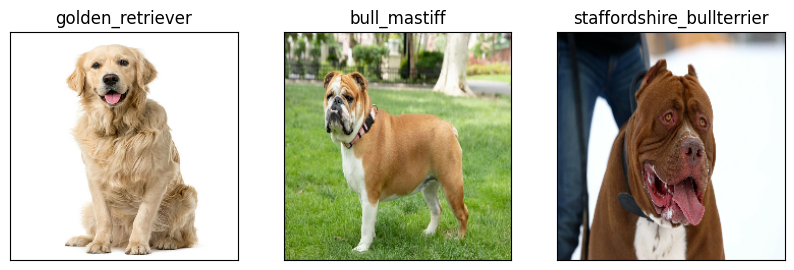

In [114]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)